In [36]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [37]:
import matplotlib.pyplot as plt
import numpy as np
import os
import sys
import cv2
from scipy import linalg
import json
import glob
import plotly.express as px
from lk_helper import *
from harris_helper import *
from copy import deepcopy

### Function to compute Average End Point Error

In [38]:
def compute_average_end_point_error(ground_truth, u, v):
    ans=0
    h,w=u.shape
    UNKNOWN_FLOW_THRESH = 1e7
    for i in range(h):
        for j in range(w):
            v2,v1=ground_truth[i][j]
            if (abs(v1)>UNKNOWN_FLOW_THRESH) | (abs(v2)> UNKNOWN_FLOW_THRESH):
                continue
            if (abs(u[i][j])>UNKNOWN_FLOW_THRESH) | (abs(v[i][j])> UNKNOWN_FLOW_THRESH):
                continue
            
            add=(v1-u[i][j])**2+(v2-v[i][j])**2
            
            if add>100:
                #print(v1,v2,add)
                pass
            ans+=math.sqrt(add)
    #rint("final add is ", add)
    ans=ans/(h*w)
    return ans

##### A small utility function

In [39]:
def normal_num(num):
    if num<10:
        ret=f"0{num}"
    else:
        ret=str(num)
    return ret

#### Plots arrows on the image

In [40]:
def fetch_quiver_plot_2(colored_image, u,v, pts, scale=50, save_path=None):
    h,w=colored_image.shape[0], colored_image.shape[1]
    f = plt.imshow(colored_image)
    ax=f.axes
    u=np.multiply(u,scale)
    v=np.multiply(v,scale)
    done=False
    # print(u.shape)
    # print(colored_image.shape)
    #print(pts[0])
    for t in pts:
        i=t[0][0]
        j=t[0][1]
        ax.arrow(i,j,u[j,i],v[j,i],head_width = 7, head_length = 5, color = (1,0,0))
    plt.rcParams["figure.figsize"] = (10,10)
    plt.show()
    if save_path is not None:
        plt.savefig(save_path)

In [41]:
def plot_visuals(colored_image, u, v, sent_skip_gap=10):
    fig = plt.figure(figsize=(30,30))
    
    u_norm=fetch_normalized_matrix(u)
    v_norm=fetch_normalized_matrix(v)
    magnitude_norm=fetch_normalized_matrix(np.sqrt(u*u+v*v))
    
    ##################################
    ax = fig.add_subplot(2,2,1)
    ax.imshow(magnitude_norm,cmap='gray')
    ax.set_title("Magnitude norm PLOT", fontsize=30)
    ax.axis('on')
    ##################################
    ax = fig.add_subplot(2,2,2)
    ax.set_title("Quiver plot throught the image", fontsize=30)
    fetch_overall_quiver_plot(colored_image,u,v,SKIP_GAP=sent_skip_gap)
    ax.axis('on')
    ################################
    ax = fig.add_subplot(2,2,3)
    ax.imshow(u_norm,cmap='gray')
    ax.set_title("Norm of horizontal velocity", fontsize=30)
    ax.axis('on')
    #############################    
    ax = fig.add_subplot(2,2,4)
    ax.imshow(v_norm,cmap='gray')
    ax.set_title("Norm of Vertical velocity", fontsize=30)
    ax.axis('on')
    ###############################
    plt.show()

In [48]:
def entire_pipeline(picture_type, lb_frame,window_sz=11,sum_mode='avg', recv_sigma_val=-1):
    
    print("Picture category is ", picture_type)
    print("WINDOW SIZE IS ", window_sz)
    print("Mode used to sum pixel contributions in the gradient covariance matrix is ", sum_mode)
    print("Sigma value being used (-1 in case MODE is NOT gaussian): ", recv_sigma_val)
    
    file_path=f"../../data/ground-truth-flow/{picture_type}/flow10.flo"
    flow_data=read_flow(file_path)
    #show_flow(file_path)
    print("flow data read")
    path_to_folder=f"/home/anmolagarwal/Desktop/cv_assignment_2/data/all-frames-colour/{picture_type}"
    image_path_1=path_to_folder+f"/frame{normal_num(lb_frame)}.png"
    image_path_2=path_to_folder+f"/frame{normal_num(lb_frame+1)}.png"
    image_1=fetch_image(image_path_1)
    image_2=fetch_image(image_path_2)
    
    ############################
    print("LK method applied")
    u, v, eigens = apply_lk_algo(fetch_image(image_path_1),
                                 fetch_image(image_path_2),
                                 [window_sz,window_sz],
                                sum_mode=sum_mode, recv_sigma_val=recv_sigma_val)
    
    col=compute_color(u,v).astype(int)
    plt.imshow(col)
    plt.show()
    ###################################
    
    with open(f"{picture_type}_corners_by_harris.json",'r') as fd:
        corners=json.load(fd)
        corners=np.array(corners)
    
    #######################################
    prefix_path=f"./saved_data/{picture_type}/frame_{lb_frame}_window_size_{window_sz}_{sum_mode}_{recv_sigma_val}"
    print("prefix path is ", prefix_path)
    print("hsv flow image being saved")
    
    print("Displaying the flow at corners only")
    plt.imsave(f"{prefix_path}_flow_hsv.jpg",col.astype(np.uint8))
    fetch_quiver_plot_2(fetch_image(image_path_1, True), u,v,corners, save_path=f"{prefix_path}_arrows.jpg")
    print("quiver plot saved")
    plt.cla() 
    plt.clf()
    err=compute_average_end_point_error(flow_data, u, v)
    print("Error is ", err)
    print("####################################")
    plot_visuals(fetch_image(image_path_1,True),u,v)
    
    

### Seeing results on the RubberWhale scene

Picture category is  RubberWhale
WINDOW SIZE IS  11
Mode used to sum pixel contributions in the gradient covariance matrix is  avg
Sigma value being used (-1 in case MODE is NOT gaussian):  -1
flow data read
LK method applied


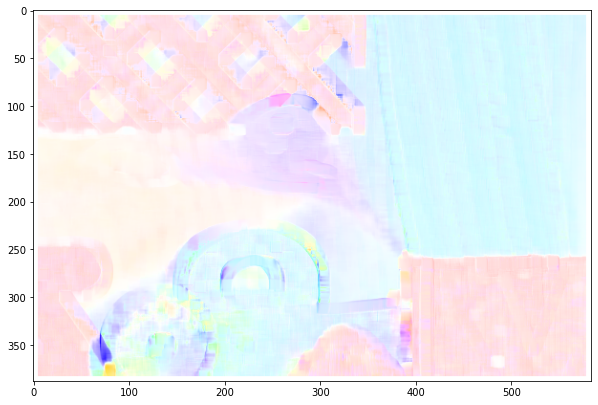

prefix path is  ./saved_data/RubberWhale/frame_7_window_size_11_avg_-1
hsv flow image being saved
Displaying the flow at corners only


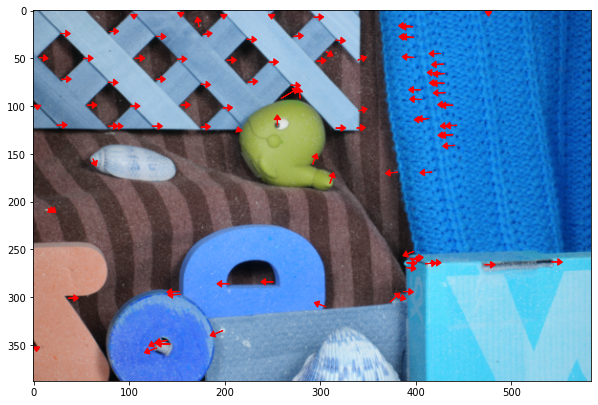

quiver plot saved
Error is  1.246725585412819
####################################


<Figure size 720x720 with 0 Axes>

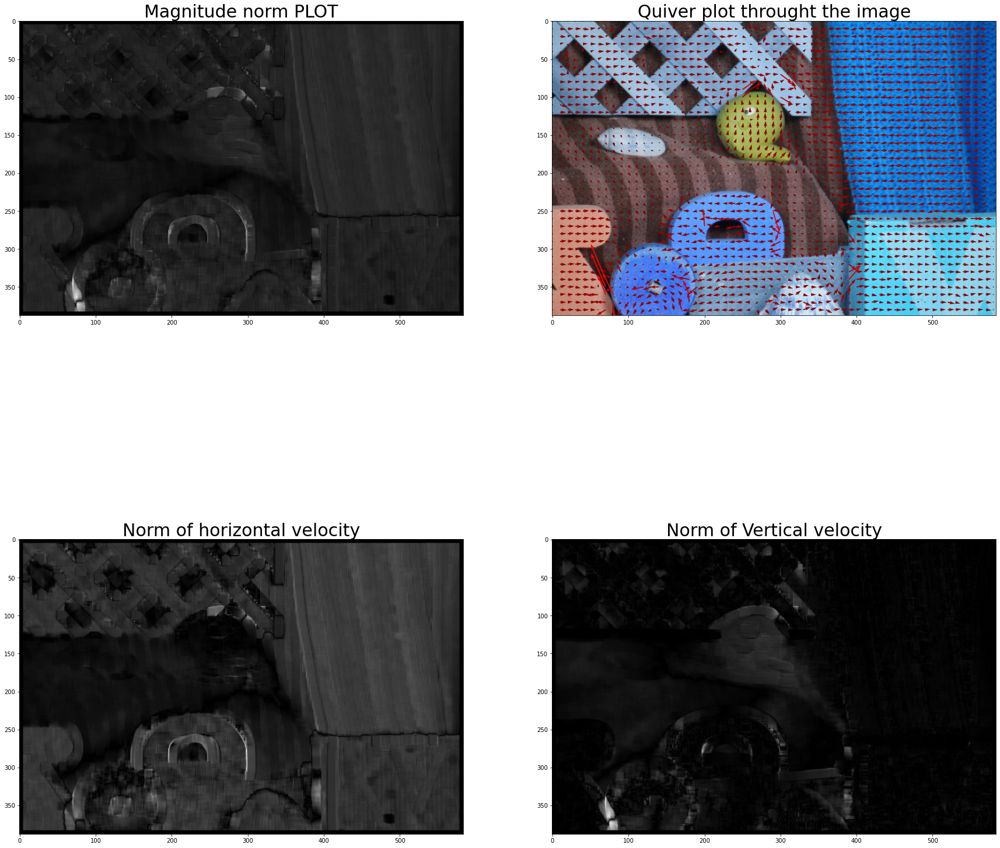

In [49]:
entire_pipeline('RubberWhale',7,window_sz=11, sum_mode='avg',recv_sigma_val=-1)

### Changing window size to 5

Picture category is  RubberWhale
WINDOW SIZE IS  5
Mode used to sum pixel contributions in the gradient covariance matrix is  avg
Sigma value being used (-1 in case MODE is NOT gaussian):  -1
flow data read
LK method applied


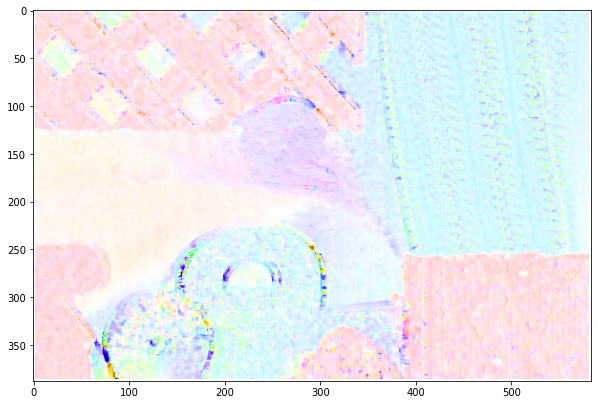

prefix path is  ./saved_data/RubberWhale/frame_7_window_size_5_avg_-1
hsv flow image being saved
Displaying the flow at corners only


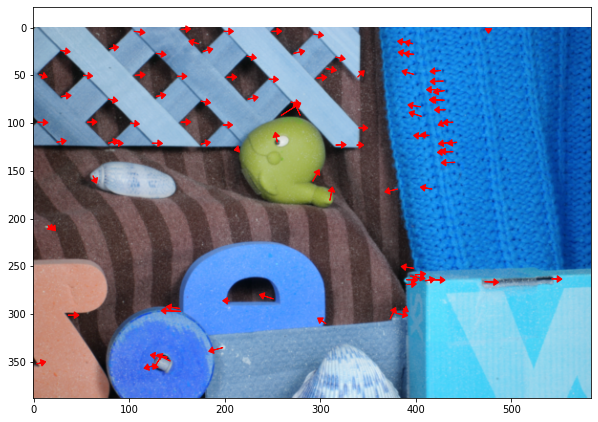

quiver plot saved
Error is  1.2464678300980947
####################################


<Figure size 720x720 with 0 Axes>

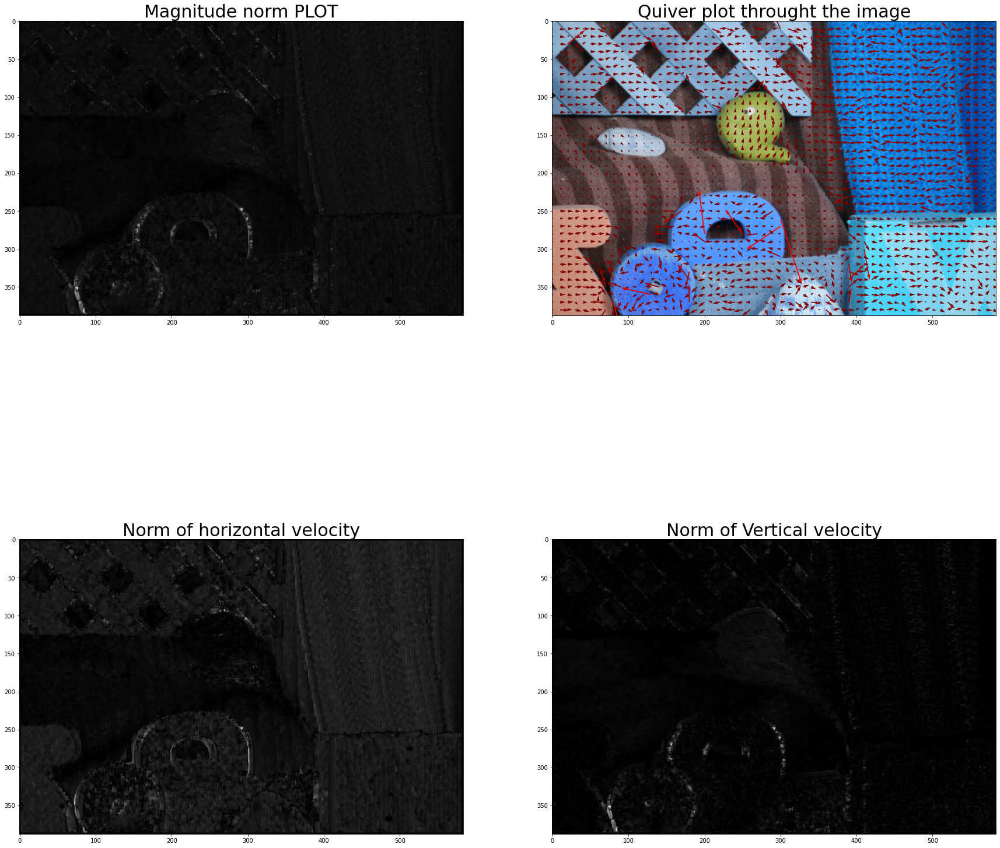

In [44]:
entire_pipeline('RubberWhale',7,window_sz=5, sum_mode='avg',recv_sigma_val=-1)

### Changing window size to 23

Picture category is  RubberWhale
WINDOW SIZE IS  23
Mode used to sum pixel contributions in the gradient covariance matrix is  avg
Sigma value being used (-1 in case MODE is NOT gaussian):  -1
flow data read
LK method applied


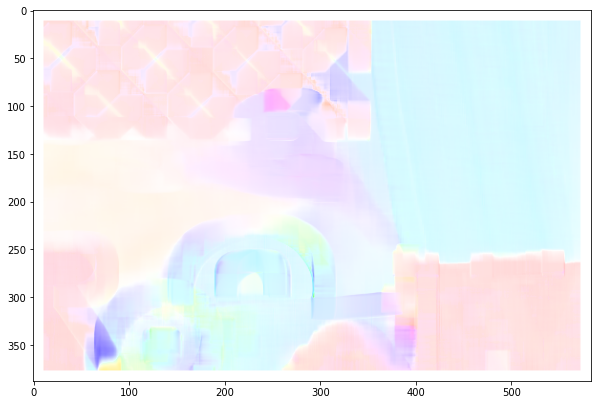

prefix path is  ./saved_data/RubberWhale/frame_7_window_size_23_avg_-1
hsv flow image being saved
Displaying the flow at corners only


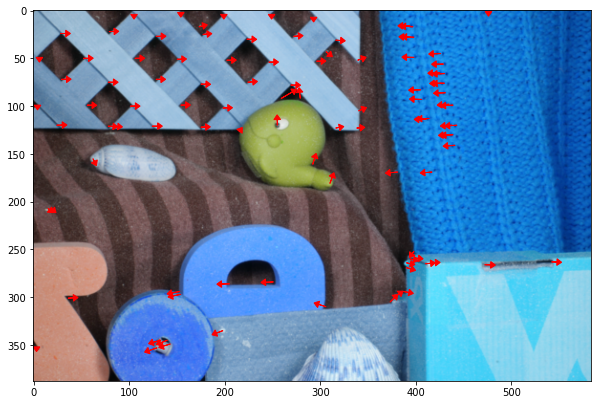

quiver plot saved
Error is  1.2485435611162983
####################################


<Figure size 720x720 with 0 Axes>

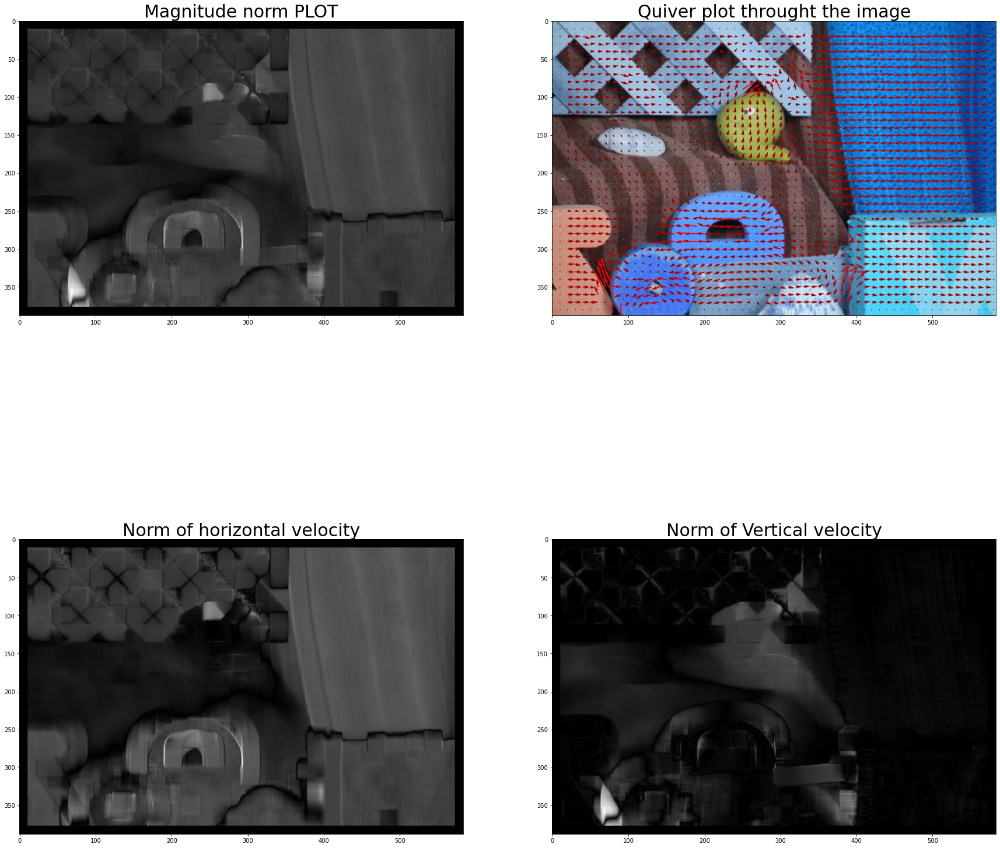

In [45]:
entire_pipeline('RubberWhale',7,window_sz=23, sum_mode='avg',recv_sigma_val=-1)

### Changing from AVG to Gaussian contribution, sigma value is 1

Picture category is  RubberWhale
WINDOW SIZE IS  11
Mode used to sum pixel contributions in the gradient covariance matrix is  gaussian
Sigma value being used (-1 in case MODE is NOT gaussian):  1
flow data read
LK method applied


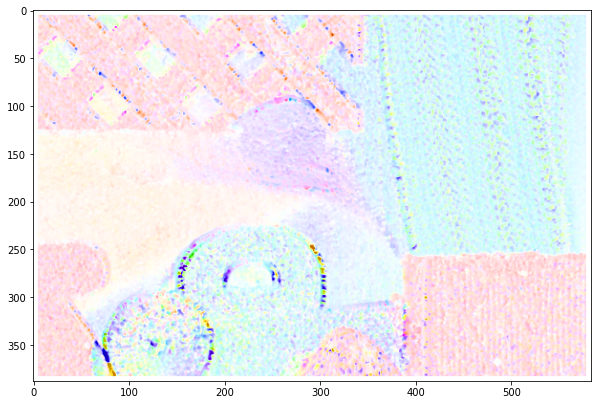

prefix path is  ./saved_data/RubberWhale/frame_7_window_size_11_gaussian_1
hsv flow image being saved
Displaying the flow at corners only


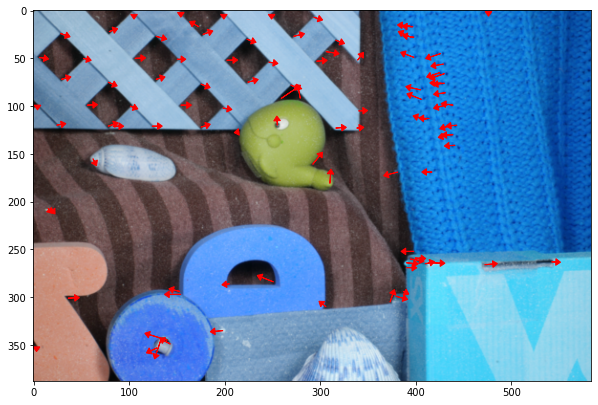

quiver plot saved
Error is  1.246331241986911
####################################


<Figure size 720x720 with 0 Axes>

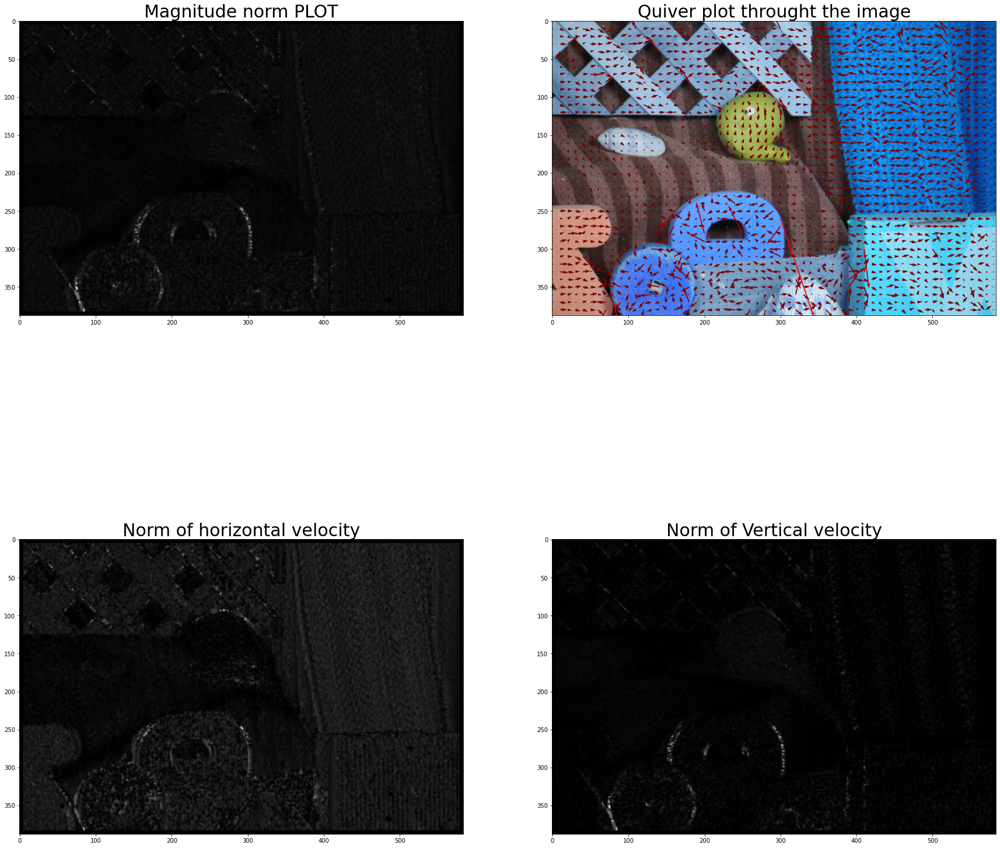

In [46]:
entire_pipeline('RubberWhale',7,window_sz=11, sum_mode='gaussian',recv_sigma_val=1)

### Keeping gaussian contribution but increasing SIGMA value to 5

Picture category is  RubberWhale
WINDOW SIZE IS  11
Mode used to sum pixel contributions in the gradient covariance matrix is  gaussian
Sigma value being used (-1 in case MODE is NOT gaussian):  5
flow data read
LK method applied


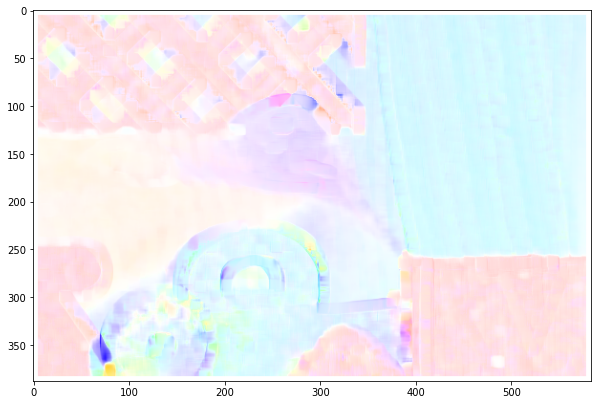

prefix path is  ./saved_data/RubberWhale/frame_7_window_size_11_gaussian_5
hsv flow image being saved
Displaying the flow at corners only


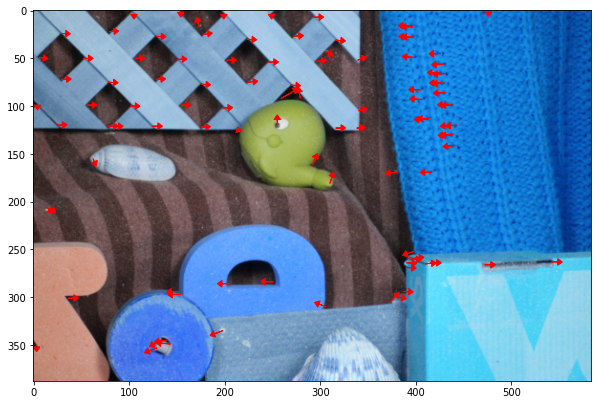

quiver plot saved
Error is  1.246604794552611
####################################


<Figure size 720x720 with 0 Axes>

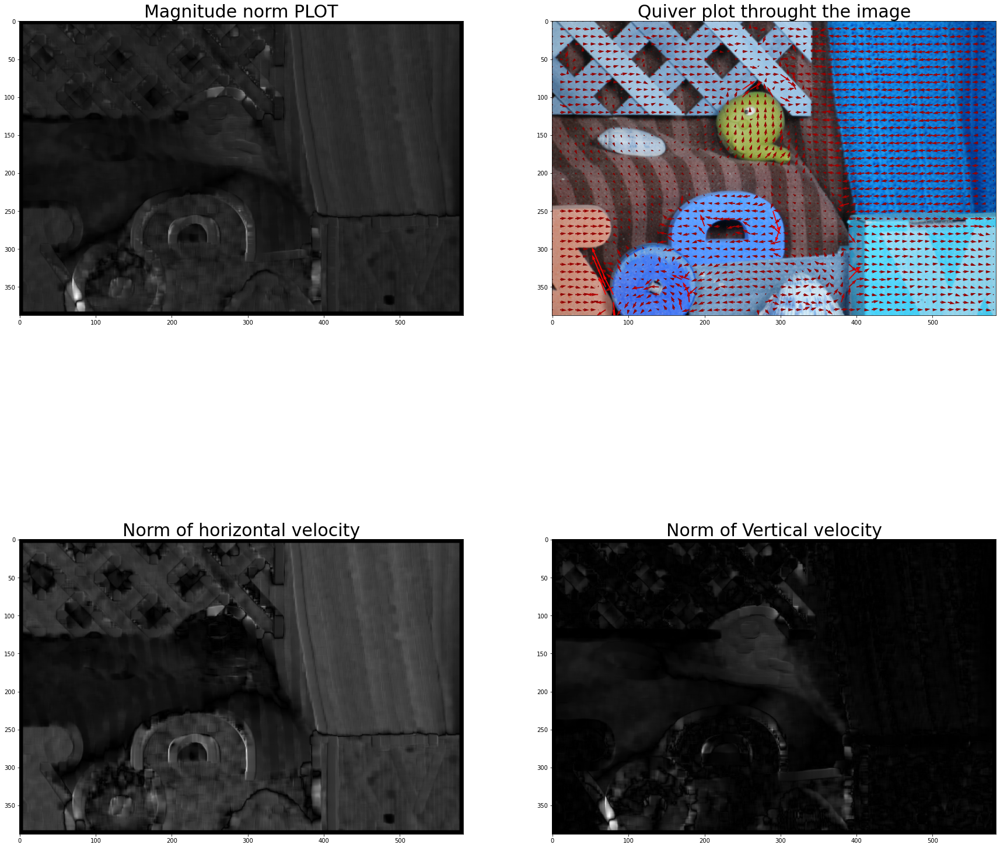

In [47]:
entire_pipeline('RubberWhale',7,window_sz=11, sum_mode='gaussian',recv_sigma_val=5)